# PanNuke Dataset EDA

This notebook provides an exploratory data analysis (EDA) of the processed PanNuke dataset output.

- **Source**: Output generated by the preprocessing pipeline
- **Goal**: Understand the distribution, structure, and characteristics of the dataset for downstream ML tasks

---


In [1]:
# Imports and setup
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
from collections import Counter
import pandas as pd

# Create EDA directory if it doesn't exist
EDA_DIR = '../EDA'
os.makedirs(EDA_DIR, exist_ok=True)

# Set paths
OUTPUT_DIR = '../output'

# Set matplotlib style for better plots
plt.style.use('default')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['savefig.bbox'] = 'tight'

In [2]:
# Fix: List tissue types using actual output directory structure

tissue_types = [d for d in os.listdir(OUTPUT_DIR) if os.path.isdir(os.path.join(OUTPUT_DIR, d))]
print(f"Tissue types found: {tissue_types}")

# Show a count of images for each tissue type
for ttype in tissue_types:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    if not os.path.exists(img_dir):
        print(f"Warning: No images directory for tissue type {ttype}")
        continue
    n_images = len([f for f in os.listdir(img_dir) if f.endswith('.png')])
    print(f"Tissue type {ttype}: {n_images} images")


Tissue types found: ['Skin', 'Prostate', 'Testis', 'Lung', 'Breast', 'HeadNeck', 'Kidney', 'Colon', 'Esophagus', 'Stomach', 'Bladder', 'Uterus', 'Ovarian', 'Bile-duct', 'Thyroid', 'Adrenal_gland', 'Cervix', 'Liver', 'Pancreatic']
Tissue type Skin: 187 images
Tissue type Prostate: 182 images
Tissue type Testis: 196 images
Tissue type Lung: 184 images
Tissue type Breast: 2351 images
Tissue type HeadNeck: 384 images
Tissue type Kidney: 134 images
Tissue type Colon: 1440 images
Tissue type Esophagus: 424 images
Tissue type Stomach: 146 images
Tissue type Bladder: 146 images
Tissue type Uterus: 186 images
Tissue type Ovarian: 146 images
Tissue type Bile-duct: 420 images
Tissue type Thyroid: 226 images
Tissue type Adrenal_gland: 437 images
Tissue type Cervix: 293 images
Tissue type Liver: 224 images
Tissue type Pancreatic: 195 images


## Visualize Raw Images and All Mask Types

Let's visualize a few random samples from the raw dataset, including:
- The raw image
- The semantic mask (with a color legend)
- The instance mask (with a color legend)

We will use a consistent color map and provide legends for interpretability.


Visualizing samples from: ['Testis', 'Lung', 'HeadNeck']


Saved: ./EDA/sample_Testis_2_01223.png


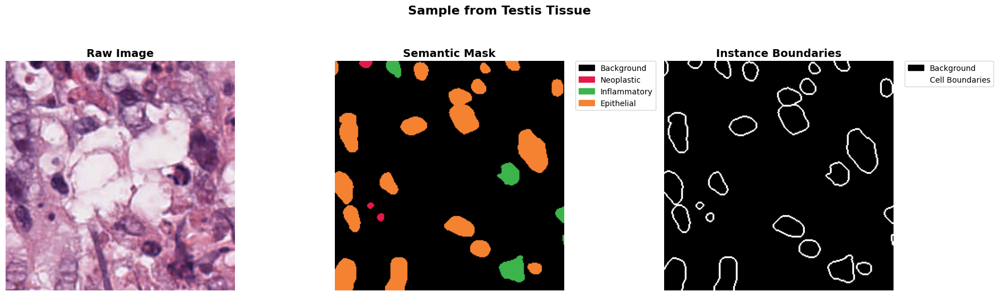

Saved: ./EDA/sample_Lung_1_01038.png


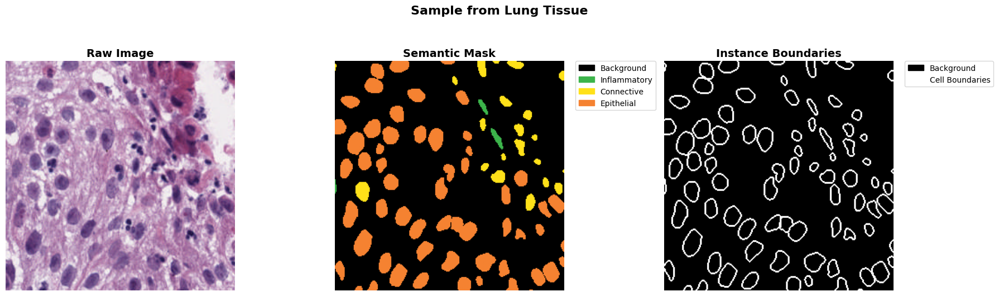

Saved: ./EDA/sample_HeadNeck_2_01866.png


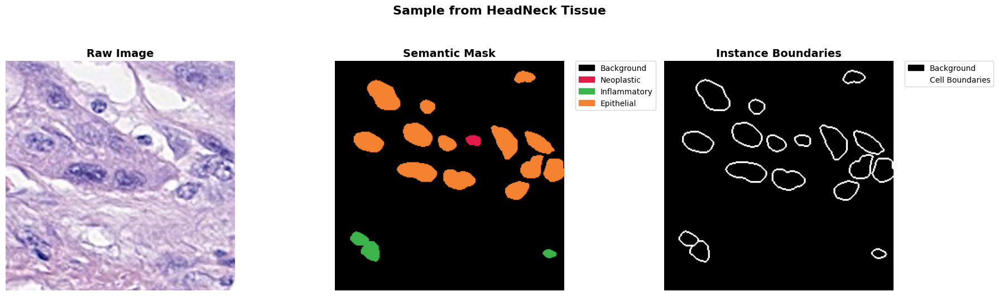


Generated 3 sample visualizations saved to ./EDA/

Creating tissue type overview...


Saved tissue overview: ./EDA/tissue_overview.png


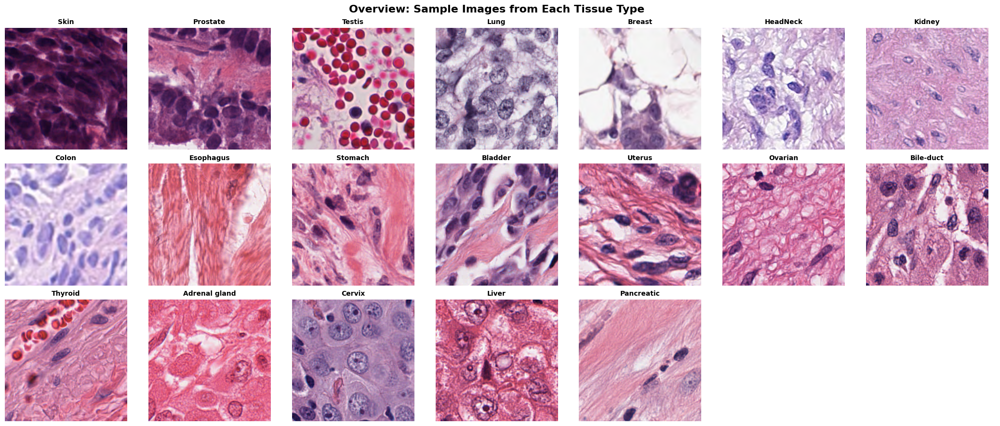

In [3]:
import matplotlib.patches as mpatches

# Define a color map and legend for semantic classes (PanNuke: 6 classes + background)
SEMANTIC_LABELS = [
    'Background', 'Neoplastic', 'Inflammatory', 'Connective', 'Dead', 'Epithelial', 'Other'
]
SEMANTIC_COLORS = [
    '#000000', '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4'
]
from matplotlib.colors import ListedColormap
sem_cmap = ListedColormap(SEMANTIC_COLORS)

# Function to plot with proper legends and save to EDA folder
def plot_with_legends(img, sem, inst, ttype, fname, save_path=None):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    
    # Raw Image
    axs[0].imshow(img)
    axs[0].set_title('Raw Image', fontsize=14, fontweight='bold')
    axs[0].axis('off')
    
    # Semantic Mask with proper legend
    im1 = axs[1].imshow(sem, cmap=sem_cmap, vmin=0, vmax=len(SEMANTIC_LABELS)-1)
    axs[1].set_title('Semantic Mask', fontsize=14, fontweight='bold')
    axs[1].axis('off')
    # Create legend with only classes present in the image
    unique_classes = np.unique(sem)
    patches = [mpatches.Patch(color=SEMANTIC_COLORS[i], label=SEMANTIC_LABELS[i]) 
               for i in unique_classes if i < len(SEMANTIC_LABELS)]
    axs[1].legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', 
                  borderaxespad=0., fontsize=10)
    
    # Instance Mask
    im2 = axs[2].imshow(inst, cmap='gray')
    axs[2].set_title('Instance Boundaries', fontsize=14, fontweight='bold')
    axs[2].axis('off')
    # Instance legend
    inst_patches = [mpatches.Patch(color='black', label='Background'),
                   mpatches.Patch(color='white', label='Cell Boundaries')]
    axs[2].legend(handles=inst_patches, bbox_to_anchor=(1.05, 1), loc='upper left', 
                  borderaxespad=0., fontsize=10)
    
    plt.suptitle(f'Sample from {ttype.replace("_", " ")} Tissue', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
    
    plt.show()

# Visualize samples from selected tissue types (limit to avoid overwhelming output)
import random
selected_tissues = random.sample(tissue_types, min(3, len(tissue_types)))
print(f"Visualizing samples from: {selected_tissues}")

sample_count = 0
for ttype in selected_tissues:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    sem_dir = os.path.join(OUTPUT_DIR, ttype, 'sem_masks')
    inst_dir = os.path.join(OUTPUT_DIR, ttype, 'inst_masks')
    
    if not os.path.exists(img_dir) or not os.path.exists(sem_dir) or not os.path.exists(inst_dir):
        print(f"Warning: Missing directories for tissue type {ttype}")
        continue
        
    files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
    if not files:
        print(f"Warning: No image files for tissue type {ttype}")
        continue
    
    # Show only 1 sample per tissue type to keep output manageable
    fname = random.choice(files)
    prefix = f"img_{ttype}_"
    if not fname.startswith(prefix):
        print(f"Warning: Unexpected filename format: {fname}")
        continue
        
    base = fname[len(prefix):]
    sem_name = f"sem_{ttype}_{base}"
    inst_name = f"inst_{ttype}_{base}"
    sem_path = os.path.join(sem_dir, sem_name)
    inst_path = os.path.join(inst_dir, inst_name)
    
    if not os.path.exists(sem_path) or not os.path.exists(inst_path):
        print(f"Warning: Missing mask for {fname} in {ttype}")
        continue
        
    img = np.array(Image.open(os.path.join(img_dir, fname)))
    sem = np.array(Image.open(sem_path))
    inst = np.array(Image.open(inst_path))
    
    # Save to EDA folder
    save_path = os.path.join(EDA_DIR, f"sample_{ttype}_{base.replace('.png', '')}.png")
    plot_with_legends(img, sem, inst, ttype, fname, save_path)
    sample_count += 1

print(f"\nGenerated {sample_count} sample visualizations saved to {EDA_DIR}/")

# Create a summary visualization showing one sample from each tissue type (saved separately)
print("\nCreating tissue type overview...")
fig, axes = plt.subplots(3, 7, figsize=(21, 9))
axes = axes.flatten()

for idx, ttype in enumerate(tissue_types[:21]):  # Limit to fit in grid
    if idx >= len(axes):
        break
        
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    if not os.path.exists(img_dir):
        continue
        
    files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
    if not files:
        continue
        
    fname = random.choice(files)
    img = np.array(Image.open(os.path.join(img_dir, fname)))
    
    axes[idx].imshow(img)
    axes[idx].set_title(ttype.replace('_', ' '), fontsize=10, fontweight='bold')
    axes[idx].axis('off')

# Hide unused subplots
for idx in range(len(tissue_types), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Overview: Sample Images from Each Tissue Type', fontsize=16, fontweight='bold')
plt.tight_layout()
overview_path = os.path.join(EDA_DIR, 'tissue_overview.png')
plt.savefig(overview_path, dpi=300, bbox_inches='tight')
print(f"Saved tissue overview: {overview_path}")
plt.show()


## 1. Directory Structure Overview

Let's inspect the output directory to see how many tissue types and images are present.


### Observations: Image Counts per Tissue Type
- Breast dominates the dataset size, followed by Colon and HeadNeck.
- Several tissues (e.g., Kidney, Bladder, Stomach, Ovarian) have far fewer samples, indicating potential imbalance.
- Consider stratified sampling or class-balanced sampling for training/validation splits.


Tissue types found: ['Skin', 'Prostate', 'Testis', 'Lung', 'Breast', 'HeadNeck', 'Kidney', 'Colon', 'Esophagus', 'Stomach', 'Bladder', 'Uterus', 'Ovarian', 'Bile-duct', 'Thyroid', 'Adrenal_gland', 'Cervix', 'Liver', 'Pancreatic']
Tissue type Skin: 187 images
Tissue type Prostate: 182 images
Tissue type Testis: 196 images
Tissue type Lung: 184 images
Tissue type Breast: 2351 images
Tissue type HeadNeck: 384 images
Tissue type Kidney: 134 images
Tissue type Colon: 1440 images
Tissue type Esophagus: 424 images
Tissue type Stomach: 146 images
Tissue type Bladder: 146 images
Tissue type Uterus: 186 images
Tissue type Ovarian: 146 images
Tissue type Bile-duct: 420 images
Tissue type Thyroid: 226 images
Tissue type Adrenal_gland: 437 images
Tissue type Cervix: 293 images
Tissue type Liver: 224 images
Tissue type Pancreatic: 195 images


Saved bar chart: ./EDA/tissue_type_distribution.png


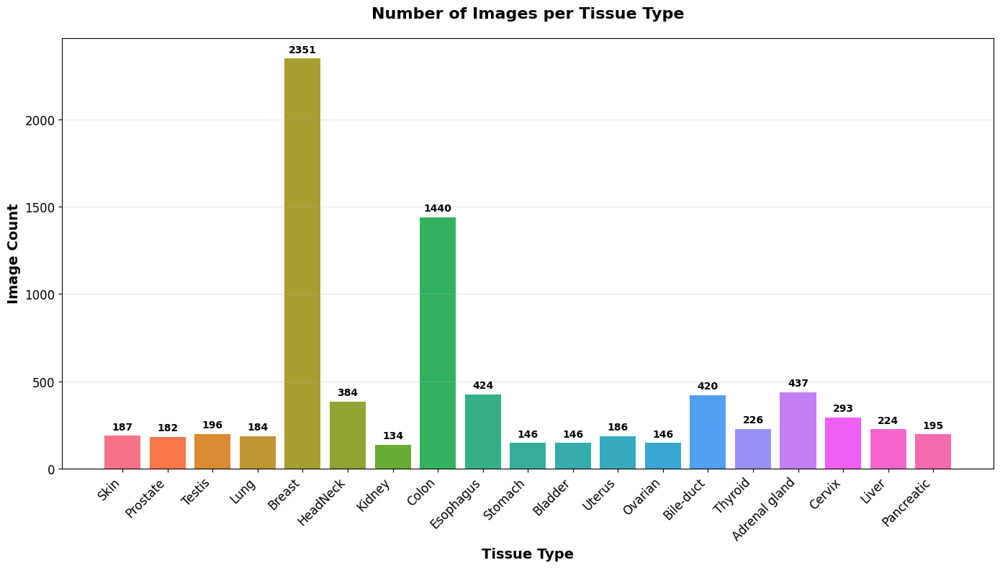

In [4]:
# List tissue types and count images per type

tissue_types = [d for d in os.listdir(OUTPUT_DIR) if os.path.isdir(os.path.join(OUTPUT_DIR, d))]
print(f"Tissue types found: {tissue_types}")

type_counts = {}
for ttype in tissue_types:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    if not os.path.exists(img_dir):
        print(f"Warning: No images directory for tissue type {ttype}")
        continue
    n_images = len([f for f in os.listdir(img_dir) if f.endswith('.png')])
    type_counts[ttype] = n_images
    print(f"Tissue type {ttype}: {n_images} images")

if type_counts:
    # Plot distribution with better formatting
    plt.figure(figsize=(14, 8))
    tissue_names = [t.replace('_', ' ') for t in type_counts.keys()]
    counts = list(type_counts.values())
    
    bars = plt.bar(tissue_names, counts, color=sns.color_palette("husl", len(tissue_names)))
    plt.title('Number of Images per Tissue Type', fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Tissue Type', fontsize=14, fontweight='bold')
    plt.ylabel('Image Count', fontsize=14, fontweight='bold')
    
    # Rotate x-axis labels to prevent overlapping
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    
    # Add value labels on bars
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(counts)*0.01,
                str(count), ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    
    # Save the plot
    bar_chart_path = os.path.join(EDA_DIR, 'tissue_type_distribution.png')
    plt.savefig(bar_chart_path, dpi=300, bbox_inches='tight')
    print(f"Saved bar chart: {bar_chart_path}")
    plt.show()
else:
    print("No images found for any tissue type.")


## 2. Sample Visualization

Let's visualize a few random samples from each tissue type, including the raw image, semantic mask, and instance mask.


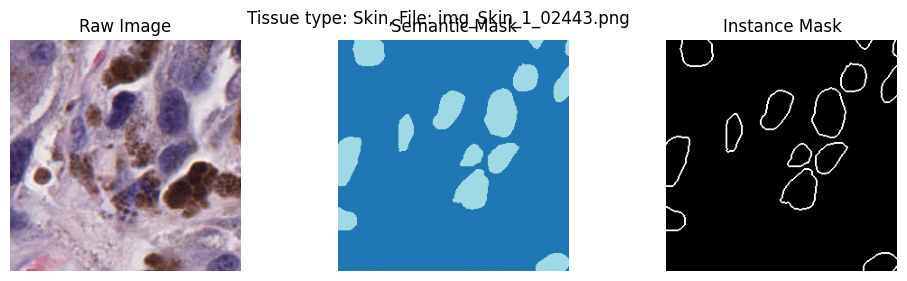

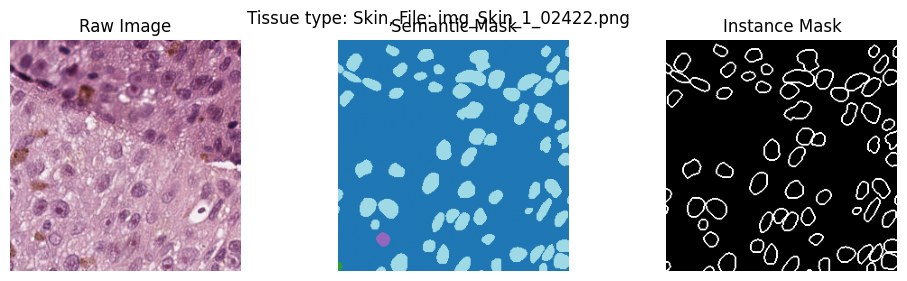

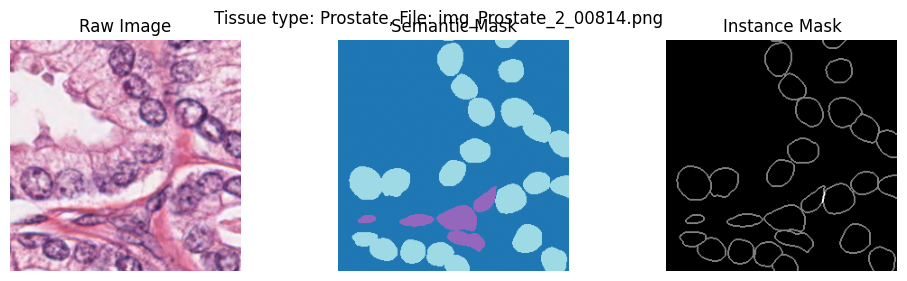

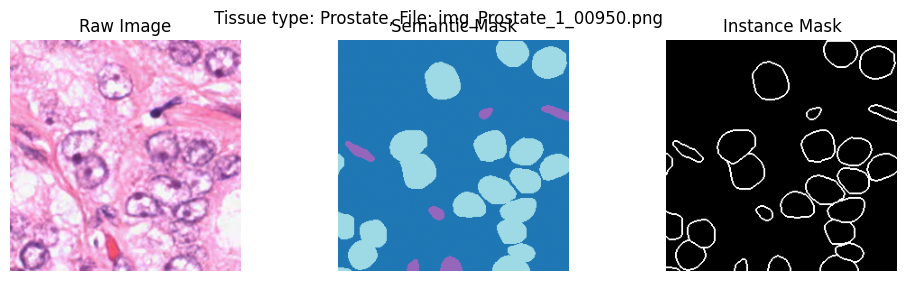

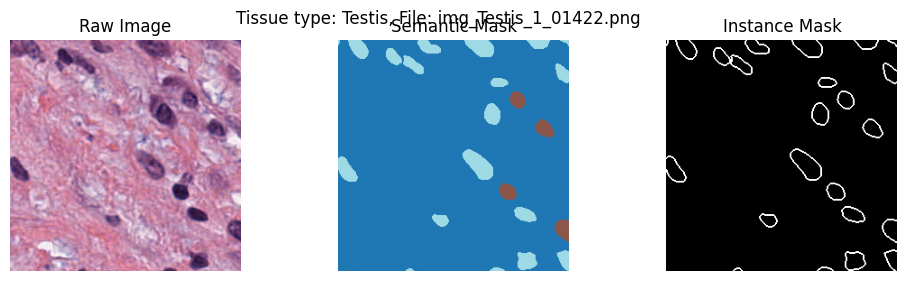

...

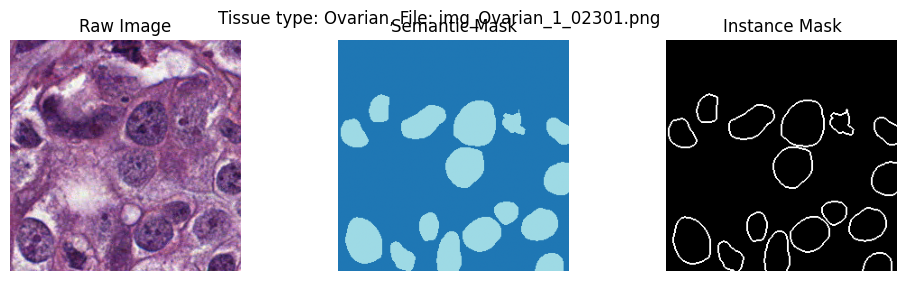

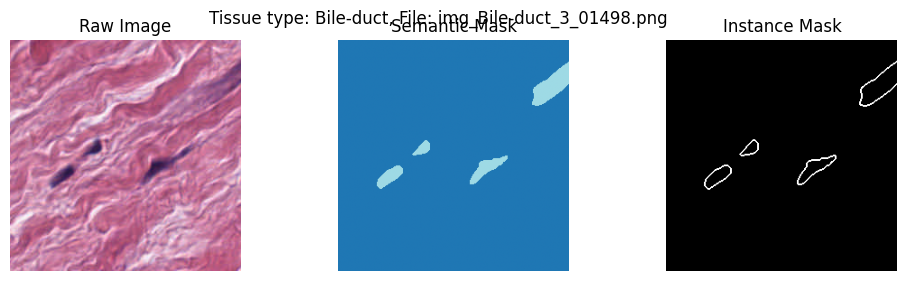

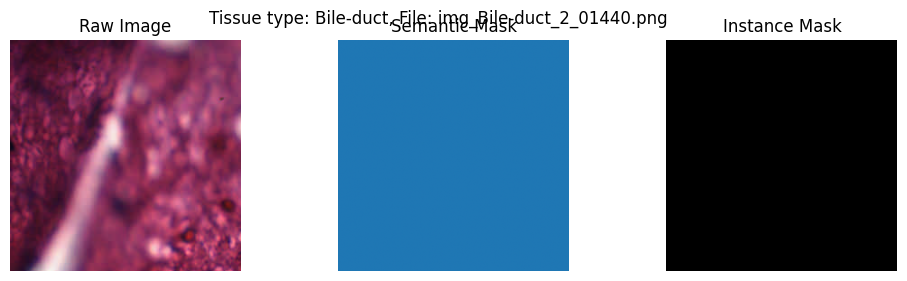

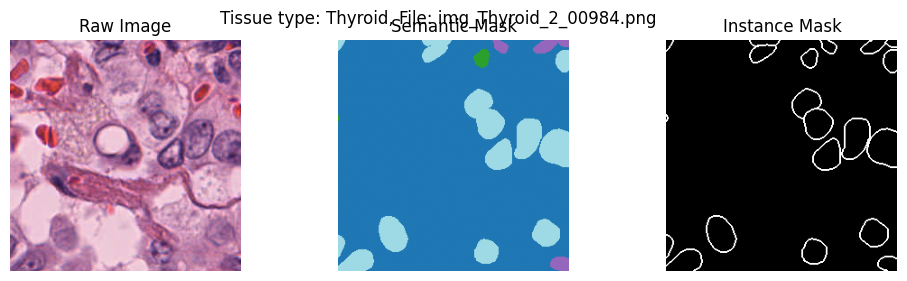

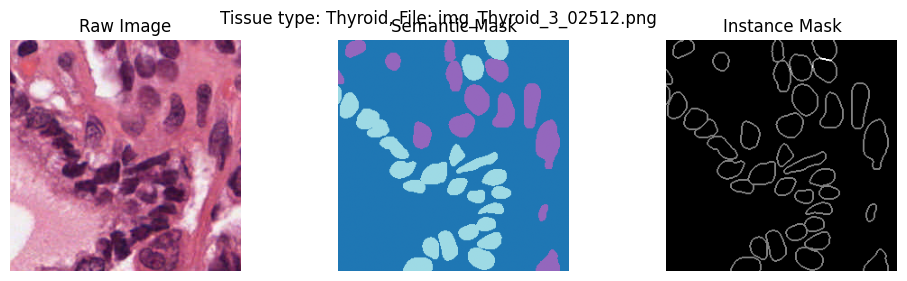

Error visualizing Adrenal_gland: [Errno 2] No such file or directory: './output/Adrenal_gland/sem_masks/sem_Adrenal_gland_gland_1_01543.png'


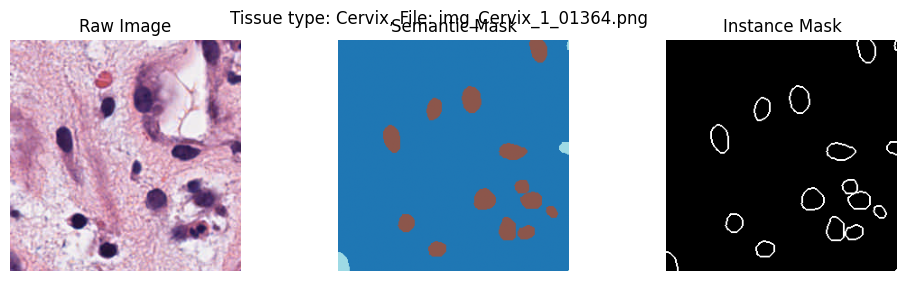

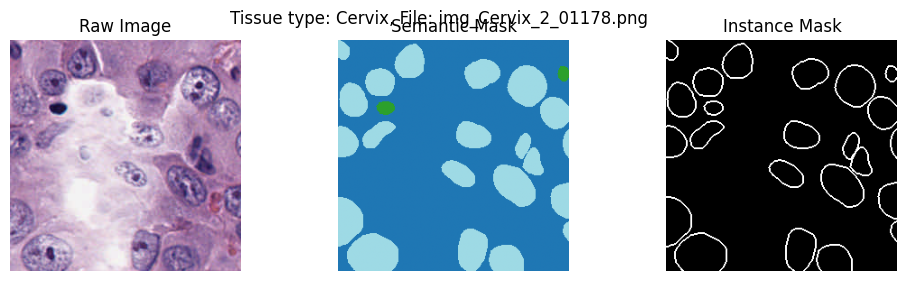

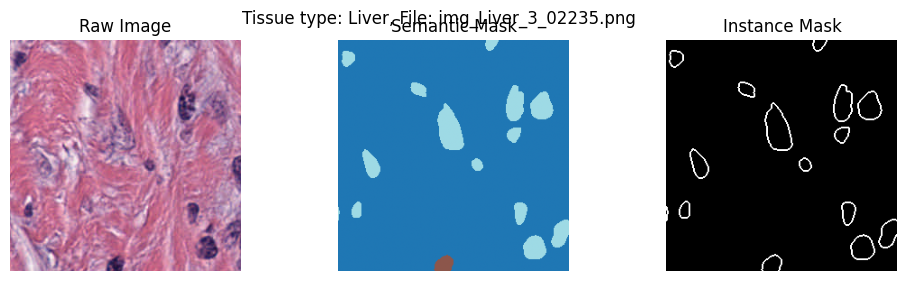

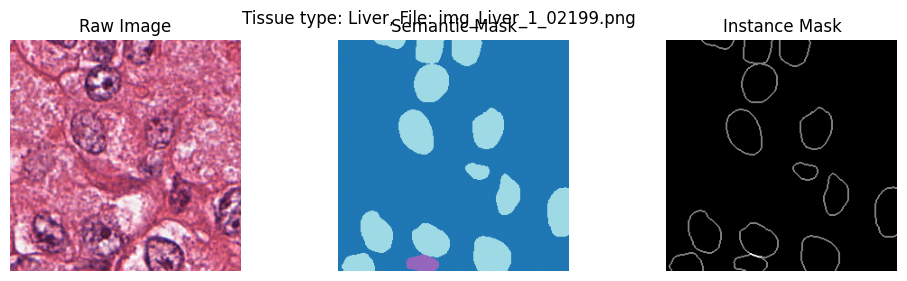

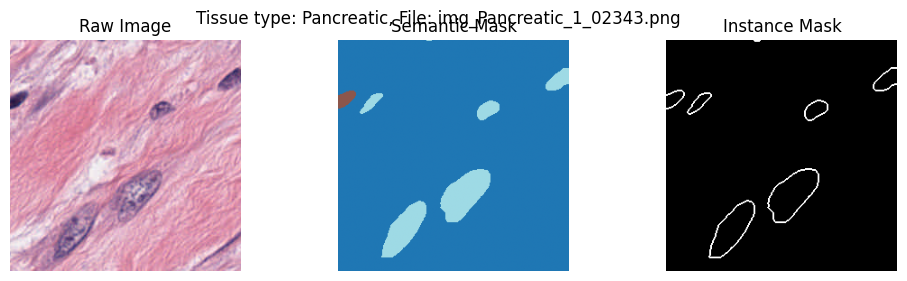

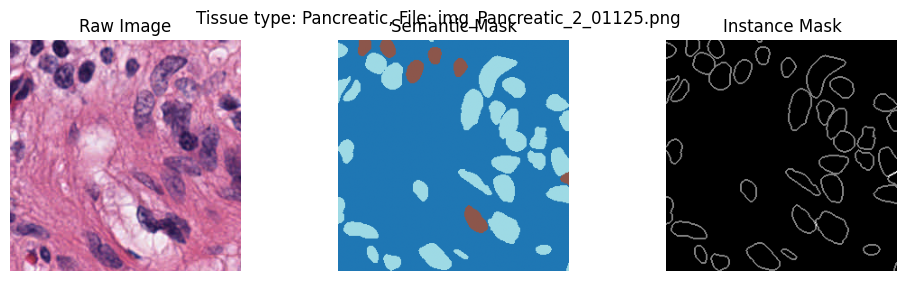

In [5]:
import random

def show_sample(ttype, n=3):
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    sem_dir = os.path.join(OUTPUT_DIR, ttype, 'sem_masks')
    inst_dir = os.path.join(OUTPUT_DIR, ttype, 'inst_masks')
    files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
    samples = random.sample(files, min(n, len(files)))
    for fname in samples:
        base = fname.split('_', 2)[-1]  # e.g., 1_00001.png
        sem_name = f"sem_{ttype}_{base}"
        inst_name = f"inst_{ttype}_{base}"
        img = np.array(Image.open(os.path.join(img_dir, fname)))
        sem = np.array(Image.open(os.path.join(sem_dir, sem_name)))
        inst = np.array(Image.open(os.path.join(inst_dir, inst_name)))
        plt.figure(figsize=(12,3))
        plt.subplot(1,3,1)
        plt.imshow(img)
        plt.title('Raw Image')
        plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow(sem, cmap='tab20')
        plt.title('Semantic Mask')
        plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(inst, cmap='gray')
        plt.title('Instance Mask')
        plt.axis('off')
        plt.suptitle(f'Tissue type: {ttype}, File: {fname}')
        plt.show()

# Show samples for each tissue type
for ttype in tissue_types:
    try:
        show_sample(ttype, n=2)
    except Exception as e:
        print(f"Error visualizing {ttype}: {e}")


### Observations: Fold Distribution
- Folds are generally well represented across tissues after fixing fold parsing.
- Some tissues show skewed fold counts (e.g., Uterus), suggesting careful attention during cross-validation setup.
- For fair benchmarking, ensure tissue-wise fold balance when evaluating models.


## 3. Fold and Lineage Analysis

Let's analyze the distribution of samples by fold, using the encoded fold number in the filenames to check for balance and traceability.


### Observations: Semantic Class Distribution (Background Excluded)
- Epithelial and Inflammatory classes are prevalent across samples, with Neoplastic varying by tissue.
- Rare classes (e.g., Dead) have significantly fewer pixels, indicating class imbalance that may require loss re-weighting or augmentation.
- For RQ2, consider whether class-specialized experts can better model rare class morphology.


Tissue type Skin fold distribution: Counter({'2': 87, '1': 59, '3': 41})
Tissue type Prostate fold distribution: Counter({'1': 77, '3': 68, '2': 37})
Tissue type Testis fold distribution: Counter({'2': 79, '1': 60, '3': 57})
Tissue type Lung fold distribution: Counter({'1': 80, '2': 53, '3': 51})
Tissue type Breast fold distribution: Counter({'1': 827, '3': 775, '2': 749})
Tissue type HeadNeck fold distribution: Counter({'2': 169, '3': 145, '1': 70})
Tissue type Kidney fold distribution: Counter({'2': 56, '3': 41, '1': 37})
Tissue type Colon fold distribution: Counter({'3': 494, '1': 478, '2': 468})
Tissue type Esophagus fold distribution: Counter({'1': 155, '3': 141, '2': 128})
Tissue type Stomach fold distribution: Counter({'1': 50, '3': 48, '2': 48})
Tissue type Bladder fold distribution: Counter({'3': 64, '2': 61, '1': 21})
Tissue type Uterus fold distribution: Counter({'3': 163, '1': 17, '2': 6})
Tissue type Ovarian fold distribution: Counter({'1': 54, '3': 52, '2': 40})
Tissue ty

Saved fold distribution chart: ./EDA/fold_distribution.png


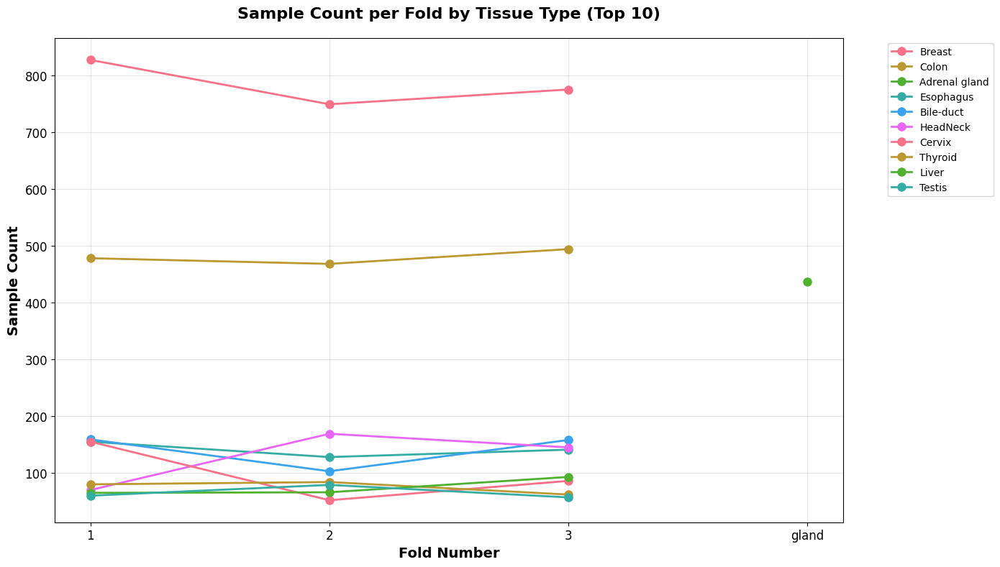

In [ ]:
# Count samples per fold for each tissue type
fold_counts = {}
for ttype in tissue_types:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    if not os.path.exists(img_dir):
        continue
    files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
    if not files:
        continue
    # Robust fold extraction that handles tissue names with underscores
    folds = []
    prefix = f"img_{ttype}_"
    for f in files:
        if not f.startswith(prefix):
            continue
        rest = f[len(prefix):]
        fold = rest.split('_')[0]
        folds.append(fold)
    fold_counts[ttype] = Counter(folds)
    print(f"Tissue type {ttype} fold distribution: {fold_counts[ttype]}")

if fold_counts:
    # Plot fold distribution for each tissue type with better formatting
    plt.figure(figsize=(14, 8))
    
    # Only plot top 10 tissue types to avoid legend overcrowding
    sorted_tissues = sorted(fold_counts.items(), key=lambda x: sum(x[1].values()), reverse=True)[:10]
    
    for ttype, fold_data in sorted_tissues:
        fold_keys = sorted(fold_data.keys())
        fold_vals = [fold_data[k] for k in fold_keys]
        plt.plot(fold_keys, fold_vals, marker='o', linewidth=2, markersize=8, 
                label=f'{ttype.replace("_", " ")}')
    
    plt.title('Sample Count per Fold by Tissue Type (Top 10)', fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Fold Number', fontsize=14, fontweight='bold')
    plt.ylabel('Sample Count', fontsize=14, fontweight='bold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    # Save the plot
    fold_chart_path = os.path.join(EDA_DIR, 'fold_distribution.png')
    plt.savefig(fold_chart_path, dpi=300, bbox_inches='tight')
    print(f"Saved fold distribution chart: {fold_chart_path}")
    plt.show()
else:
    print("No fold information found in filenames.")



### Observations: Instance Count Distribution
- Mean instances per image ~ reported in the figure; high variance suggests heterogeneous cell densities across tissues.
- For RQ1/RQ2 comparisons, normalize metrics by density where appropriate (e.g., per-instance metrics alongside per-image).


## 4. Semantic Class Distribution

Let's analyze the pixel-wise class distribution in the semantic masks to understand class imbalance and prevalence.


Pixel count per class: Counter({np.uint8(0): np.int64(101560252), np.uint8(5): np.int64(14259372), np.uint8(2): np.int64(4602858), np.uint8(1): np.int64(2161981), np.uint8(4): np.int64(1752734), np.uint8(3): np.int64(181203)})
Saved semantic class distribution: ./EDA/semantic_class_distribution.png


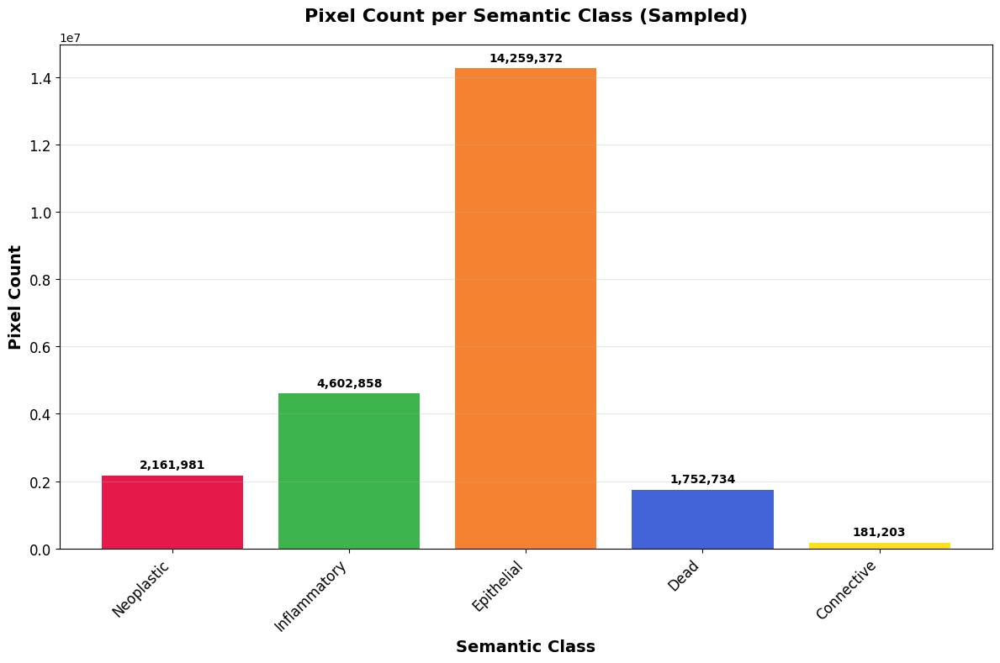

In [7]:
# Analyze pixel-wise class distribution in semantic masks
class_pixel_counts = Counter()
sample_limit = 100  # Limit for speed; set None to use all

for ttype in tissue_types:
    sem_dir = os.path.join(OUTPUT_DIR, ttype, 'sem_masks')
    if not os.path.exists(sem_dir):
        continue
    files = [f for f in os.listdir(sem_dir) if f.endswith('.png')]
    for fname in files[:sample_limit]:
        sem_path = os.path.join(sem_dir, fname)
        if not os.path.exists(sem_path):
            continue
        sem = np.array(Image.open(sem_path))
        vals, counts = np.unique(sem, return_counts=True)
        for v, c in zip(vals, counts):
            class_pixel_counts[v] += c

print("Pixel count per class:", class_pixel_counts)

# Plot with better formatting and semantic class names
plt.figure(figsize=(12, 8))
class_labels = []
class_counts = []

for class_id, count in class_pixel_counts.items():
    if isinstance(class_id, np.uint8):
        class_id = int(class_id)
    # exclude background (class_id == 0)
    if class_id < len(SEMANTIC_LABELS) and class_id != 0:
        class_labels.append(SEMANTIC_LABELS[class_id])
        class_counts.append(int(count))

# colors aligned with labels (skip background at index 0)
colors = [SEMANTIC_COLORS[SEMANTIC_LABELS.index(lbl)] for lbl in class_labels]
bars = plt.bar(class_labels, class_counts, color=colors)
plt.title('Pixel Count per Semantic Class (Sampled)', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Semantic Class', fontsize=14, fontweight='bold')
plt.ylabel('Pixel Count', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

# Add value labels on bars
for bar, count in zip(bars, class_counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(class_counts)*0.01,
            f'{count:,}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

# Save the plot
semantic_chart_path = os.path.join(EDA_DIR, 'semantic_class_distribution.png')
plt.savefig(semantic_chart_path, dpi=300, bbox_inches='tight')
print(f"Saved semantic class distribution: {semantic_chart_path}")
plt.show()


## 5. Instance Count Distribution

Let's analyze the number of instances per image (from the instance masks) to understand object density and complexity.


Saved instance count distribution: ./EDA/instance_count_distribution.png


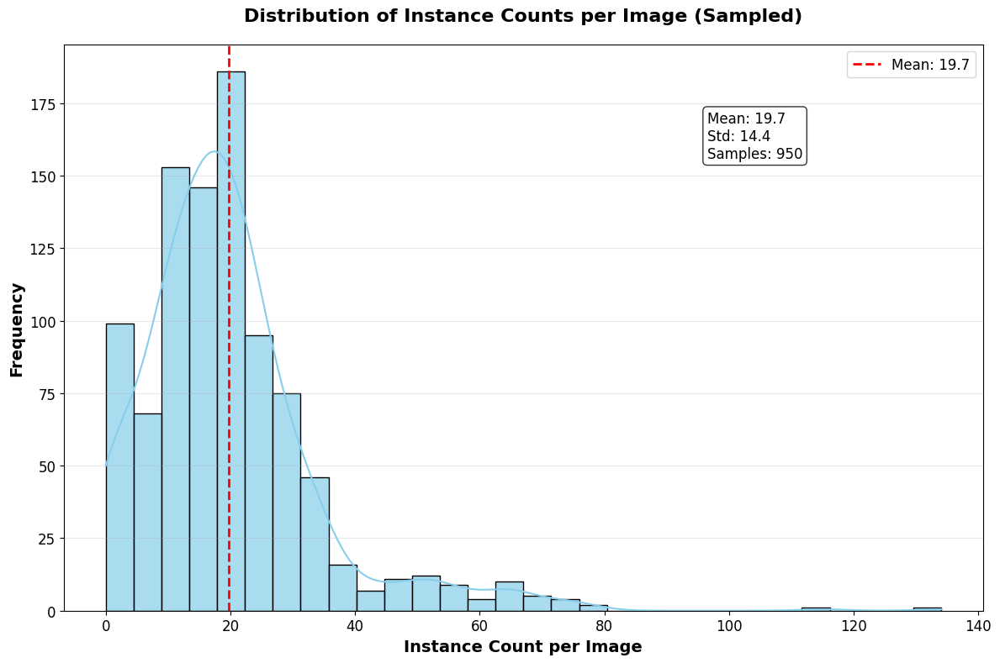

Statistics: Mean instances per image: 19.68 ± 14.37


In [8]:
# Analyze number of instances per image (approximate by counting connected components in instance mask)
from scipy.ndimage import label

instance_counts = []
sample_limit = 50  # Limit for speed

for ttype in tissue_types:
    inst_dir = os.path.join(OUTPUT_DIR, ttype, 'inst_masks')
    if not os.path.exists(inst_dir):
        continue
    files = [f for f in os.listdir(inst_dir) if f.endswith('.png')]
    for fname in files[:sample_limit]:
        inst_path = os.path.join(inst_dir, fname)
        if not os.path.exists(inst_path):
            continue
        inst = np.array(Image.open(inst_path))
        # Each connected component is an instance boundary
        labeled, n = label(inst > 0)
        instance_counts.append(n)

plt.figure(figsize=(12, 8))
sns.histplot(instance_counts, bins=30, kde=True, color='skyblue', alpha=0.7)
plt.title('Distribution of Instance Counts per Image (Sampled)', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Instance Count per Image', fontsize=14, fontweight='bold')
plt.ylabel('Frequency', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', alpha=0.3)

# Add statistics text
mean_instances = np.mean(instance_counts)
std_instances = np.std(instance_counts)
plt.axvline(mean_instances, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_instances:.1f}')
plt.text(0.7, 0.8, f'Mean: {mean_instances:.1f}\nStd: {std_instances:.1f}\nSamples: {len(instance_counts)}',
         transform=plt.gca().transAxes, fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

plt.legend(fontsize=12)
plt.tight_layout()

# Save the plot
instance_chart_path = os.path.join(EDA_DIR, 'instance_count_distribution.png')
plt.savefig(instance_chart_path, dpi=300, bbox_inches='tight')
print(f"Saved instance count distribution: {instance_chart_path}")
plt.show()

print(f"Statistics: Mean instances per image: {mean_instances:.2f} ± {std_instances:.2f}")


## 6. Summary and Next Steps

- We explored the structure, class, and instance distributions of the PanNuke dataset output.
- The dataset is well-structured for ML tasks, with lineage preserved in filenames.
- Next steps could include:
  - Stratified train/val/test splitting
  - Data augmentation analysis
  - Model prototyping

---

*Feel free to extend this notebook for deeper analysis or visualization needs!*


### Observations: RQ2 Per-Tissue Class Ratios
- Clear tissue-specific differences in class composition (e.g., higher Epithelial in Breast), reinforcing the case for expert models.
- Unified models may be biased toward dominant classes/tissues; ensembling experts could mitigate this.


### Observations: RQ3 Color Variability (HED/RGB proxy)
- Notable inter-tissue variability suggests stain normalization (e.g., Vahadane) could stabilize color distributions.
- For RQ3 evaluation, compute mPQ/Dice per tissue before vs. after normalization to measure gains.


## Enhanced Sample Visualization: Per-Instance Coloring and Overlays

Each nucleus instance is colored uniquely. We also provide overlays on the raw image for clarity, and save each figure to the `EDA/` folder for report use.


Saved per-instance visualization: ./EDA/instance_colored_Testis_2_01233.png


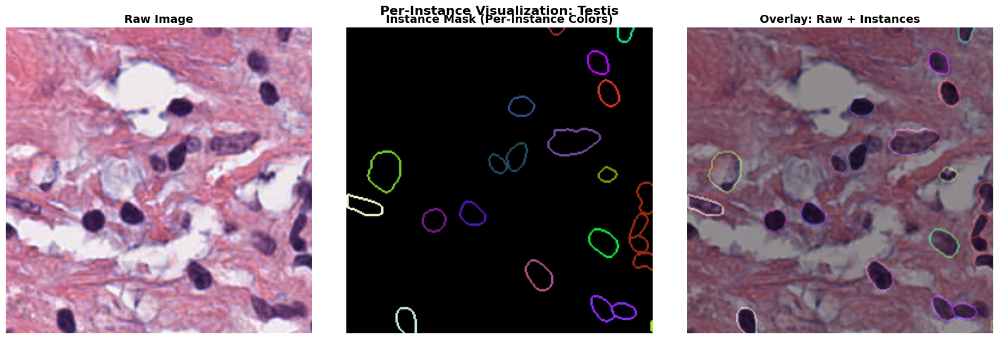

Saved per-instance visualization: ./EDA/instance_colored_Lung_3_00941.png


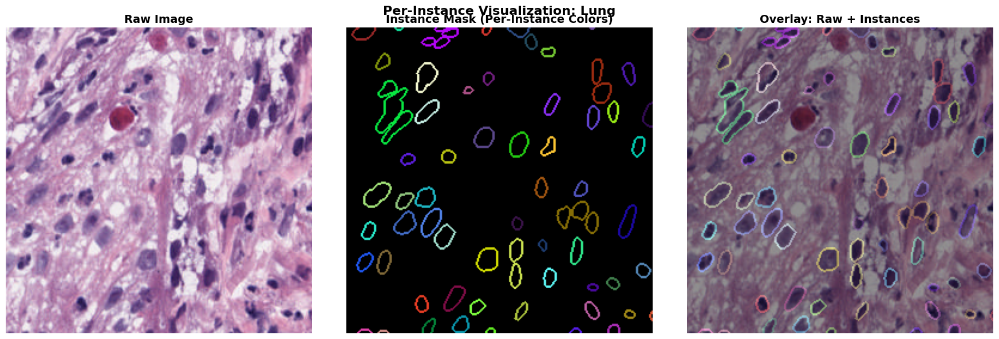

Saved per-instance visualization: ./EDA/instance_colored_HeadNeck_1_02128.png


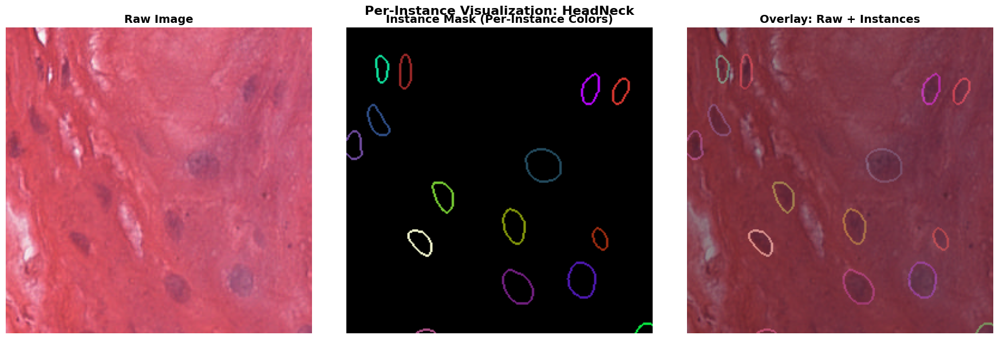

In [9]:
from scipy.ndimage import label as cc_label
from matplotlib.colors import ListedColormap

# Random colormap for up to N instances
np.random.seed(42)
INST_MAX = 256
rand_colors = np.random.rand(INST_MAX, 3)
rand_colors[0] = [0, 0, 0]  # background black
inst_cmap = ListedColormap(rand_colors)

def colorize_instances(inst_mask):
    labeled, _ = cc_label(inst_mask > 0)
    return labeled

def plot_with_instance_colors(img, sem, inst, ttype, base, save_path):
    labeled = colorize_instances(inst)
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(img)
    axs[0].set_title('Raw Image', fontsize=14, fontweight='bold')
    axs[0].axis('off')

    axs[1].imshow(labeled, cmap=inst_cmap, vmin=0, vmax=INST_MAX-1)
    axs[1].set_title('Instance Mask (Per-Instance Colors)', fontsize=14, fontweight='bold')
    axs[1].axis('off')

    axs[2].imshow(img)
    axs[2].imshow(labeled, cmap=inst_cmap, alpha=0.4, vmin=0, vmax=INST_MAX-1)
    axs[2].set_title('Overlay: Raw + Instances', fontsize=14, fontweight='bold')
    axs[2].axis('off')

    plt.suptitle(f'Per-Instance Visualization: {ttype.replace("_"," ")}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f'Saved per-instance visualization: {save_path}')
    plt.show()

# Generate a few per-instance visuals
per_instance_count = 0
for ttype in selected_tissues:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    sem_dir = os.path.join(OUTPUT_DIR, ttype, 'sem_masks')
    inst_dir = os.path.join(OUTPUT_DIR, ttype, 'inst_masks')
    files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
    if not files:
        continue
    fname = random.choice(files)
    base = fname[len(f'img_{ttype}_'):]
    sem_path = os.path.join(sem_dir, f'sem_{ttype}_{base}')
    inst_path = os.path.join(inst_dir, f'inst_{ttype}_{base}')
    if not (os.path.exists(sem_path) and os.path.exists(inst_path)):
        continue
    img = np.array(Image.open(os.path.join(img_dir, fname)))
    sem = np.array(Image.open(sem_path))
    inst = np.array(Image.open(inst_path))
    save_path = os.path.join(EDA_DIR, f'instance_colored_{ttype}_{base.replace(".png","")}.png')
    plot_with_instance_colors(img, sem, inst, ttype, base, save_path)
    per_instance_count += 1
    if per_instance_count >= 3:
        break


## Research Questions: EDA-Oriented Visualizations

Below we add targeted EDA visualizations aligned with your research questions (RQ1–RQ4). These do not solve the tasks, but provide descriptive context for later evaluation.


In [10]:
# RQ1: Baseline dataset descriptors for segmentation evaluation context
# We summarize per-tissue image counts and approximate instance density

# Build a small summary table: images per tissue, sampled mean instances per image
summary_rows = []
for ttype in tissue_types:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    inst_dir = os.path.join(OUTPUT_DIR, ttype, 'inst_masks')
    if not (os.path.exists(img_dir) and os.path.exists(inst_dir)):
        continue
    imgs = [f for f in os.listdir(img_dir) if f.endswith('.png')]
    sample_imgs = imgs[:50]  # sample for speed
    inst_counts = []
    for fname in sample_imgs:
        base = fname[len(f'img_{ttype}_'):]
        inst_path = os.path.join(inst_dir, f'inst_{ttype}_{base}')
        if not os.path.exists(inst_path):
            continue
        inst = np.array(Image.open(inst_path))
        from scipy.ndimage import label
        _, n = label(inst > 0)
        inst_counts.append(n)
    row = {
        'tissue': ttype,
        'num_images': len(imgs),
        'mean_instances_per_image': float(np.mean(inst_counts)) if inst_counts else np.nan,
        'std_instances_per_image': float(np.std(inst_counts)) if inst_counts else np.nan
    }
    summary_rows.append(row)

df_summary = pd.DataFrame(summary_rows).sort_values('num_images', ascending=False)
display(df_summary)

# Save as CSV for reference in model evaluation stage
csv_path = os.path.join(EDA_DIR, 'rq1_dataset_summary.csv')
df_summary.to_csv(csv_path, index=False)
print(f"Saved RQ1 dataset summary to {csv_path}")


,tissue,num_images,mean_instances_per_image,std_instances_per_image
4,Breast,2351,15.02,8.065953
7,Colon,1440,18.88,12.877329
15,Adrenal_gland,437,13.44,6.708681
8,Esophagus,424,12.46,7.499893
13,Bile-duct,420,18.02,10.621657
5,HeadNeck,384,19.28,11.946615
16,Cervix,293,21.38,10.738510
14,Thyroid,226,17.68,7.793433
17,Liver,224,17.76,12.168089
2,Testis,196,19.70,16.322071


Saved RQ1 dataset summary to ./EDA/rq1_dataset_summary.csv


Saved: ./EDA/rq2_overall_semantic_distribution.png


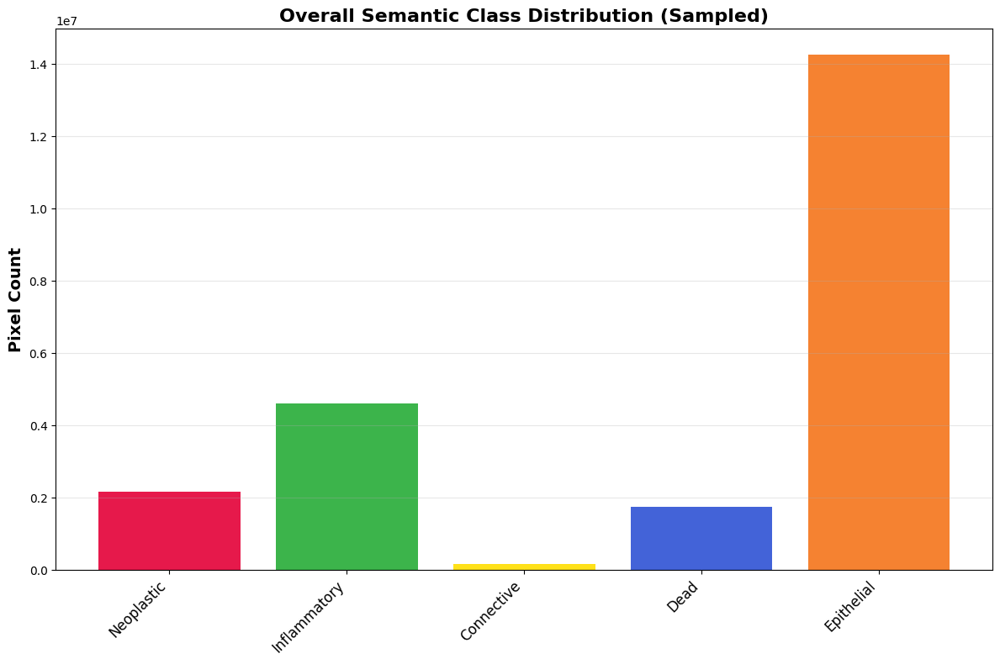

Saved: ./EDA/rq2_per_tissue_class_ratios_heatmap.png


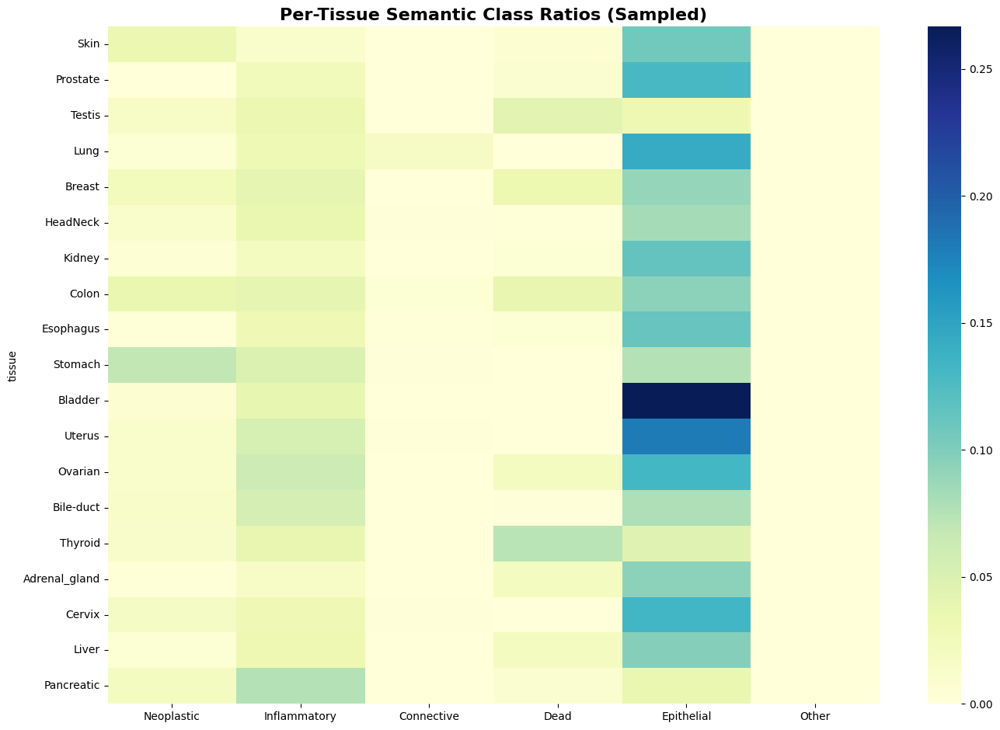

In [11]:
# RQ2: Class distribution and imbalance analysis (per tissue and overall)

# Overall semantic class distribution
overall_class_counts = Counter()
for ttype in tissue_types:
    sem_dir = os.path.join(OUTPUT_DIR, ttype, 'sem_masks')
    if not os.path.exists(sem_dir):
        continue
    files = [f for f in os.listdir(sem_dir) if f.endswith('.png')][:100]
    for fname in files:
        sem = np.array(Image.open(os.path.join(sem_dir, fname)))
        vals, counts = np.unique(sem, return_counts=True)
        for v, c in zip(vals, counts):
            overall_class_counts[int(v)] += int(c)

# Plot overall distribution
plt.figure(figsize=(12, 8))
labels = [SEMANTIC_LABELS[i] for i in sorted(overall_class_counts.keys()) if i < len(SEMANTIC_LABELS) and i != 0]
counts = [overall_class_counts[i] for i in sorted(overall_class_counts.keys()) if i < len(SEMANTIC_LABELS) and i != 0]
colors = [SEMANTIC_COLORS[i] for i in sorted(overall_class_counts.keys()) if i < len(SEMANTIC_LABELS) and i != 0]

bars = plt.bar(labels, counts, color=colors)
plt.title('Overall Semantic Class Distribution (Sampled)', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.ylabel('Pixel Count', fontsize=14, fontweight='bold')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
path_overall = os.path.join(EDA_DIR, 'rq2_overall_semantic_distribution.png')
plt.savefig(path_overall, dpi=300, bbox_inches='tight')
print(f'Saved: {path_overall}')
plt.show()

# Per-tissue semantic class ratio heatmap (sampled)
rows = []
for ttype in tissue_types:
    sem_dir = os.path.join(OUTPUT_DIR, ttype, 'sem_masks')
    if not os.path.exists(sem_dir):
        continue
    files = [f for f in os.listdir(sem_dir) if f.endswith('.png')][:50]
    counts = Counter()
    total = 0
    for fname in files:
        sem = np.array(Image.open(os.path.join(sem_dir, fname)))
        vals, cts = np.unique(sem, return_counts=True)
        for v, c in zip(vals, cts):
            if v < len(SEMANTIC_LABELS):
                counts[int(v)] += int(c)
                total += int(c)
    if total == 0:
        continue
    ratios = {SEMANTIC_LABELS[i]: counts.get(i, 0)/total for i in range(1, len(SEMANTIC_LABELS))}
    ratios['tissue'] = ttype
    rows.append(ratios)

df_ratios = pd.DataFrame(rows).set_index('tissue')
plt.figure(figsize=(14, max(6, len(df_ratios)*0.5)))
sns.heatmap(df_ratios, cmap='YlGnBu', annot=False)
plt.title('Per-Tissue Semantic Class Ratios (Sampled)', fontsize=16, fontweight='bold')
plt.tight_layout()
path_heatmap = os.path.join(EDA_DIR, 'rq2_per_tissue_class_ratios_heatmap.png')
plt.savefig(path_heatmap, dpi=300, bbox_inches='tight')
print(f'Saved: {path_heatmap}')
plt.show()


Saved: ./EDA/rq3_color_variability_heatmap.png


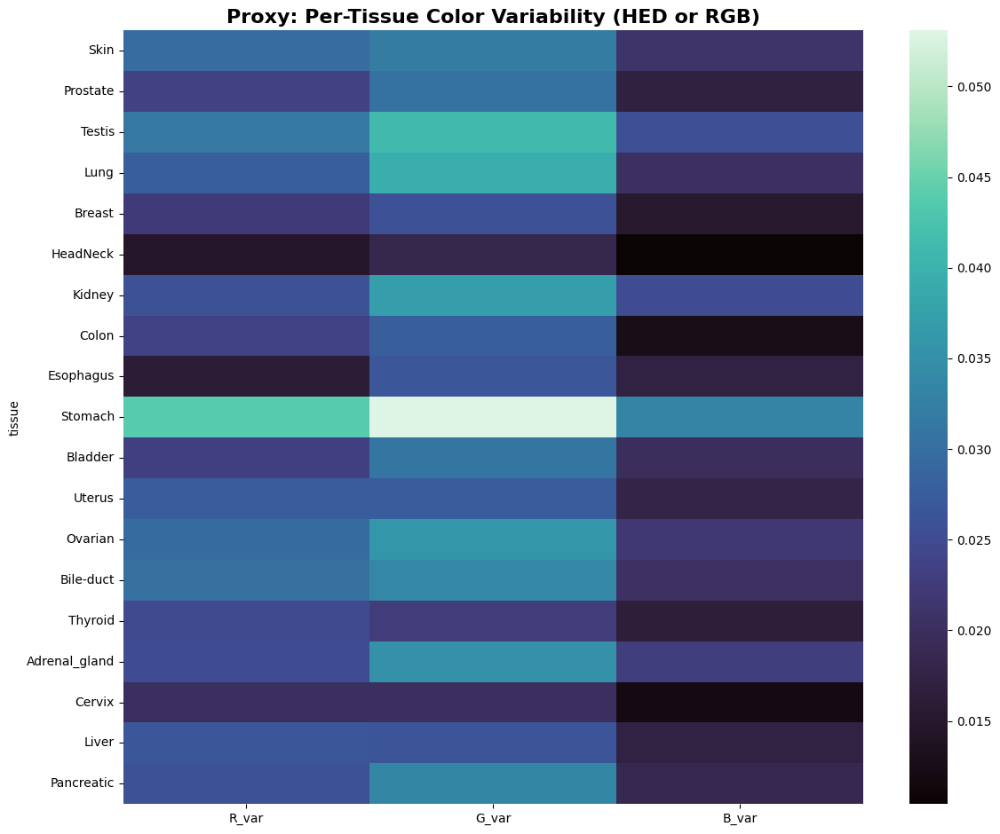

In [12]:
# RQ3: Stain normalization impact placeholder EDA
# We cannot apply normalization here, but we can measure color variability proxies per tissue

# If skimage is unavailable, fallback to simple color variance in RGB as proxy
try:
    from skimage.color import rgb2hed  # type: ignore
    use_hed = True
except Exception:
    use_hed = False

rows = []
for ttype in tissue_types:
    img_dir = os.path.join(OUTPUT_DIR, ttype, 'images')
    if not os.path.exists(img_dir):
        continue
    files = [f for f in os.listdir(img_dir) if f.endswith('.png')][:30]
    ch_vars = []
    for fname in files:
        img = np.array(Image.open(os.path.join(img_dir, fname))).astype(np.float32) / 255.0
        try:
            if use_hed:
                hed = rgb2hed(img)
                ch_vars.append(np.var(hed, axis=(0,1)))
            else:
                ch_vars.append(np.var(img, axis=(0,1)))
        except Exception:
            continue
    if ch_vars:
        ch_vars = np.array(ch_vars)
        if use_hed:
            rows.append({'tissue': ttype,
                         'C1_var': float(np.mean(ch_vars[:,0])),
                         'C2_var': float(np.mean(ch_vars[:,1])),
                         'C3_var': float(np.mean(ch_vars[:,2]))})
        else:
            rows.append({'tissue': ttype,
                         'R_var': float(np.mean(ch_vars[:,0])),
                         'G_var': float(np.mean(ch_vars[:,1])),
                         'B_var': float(np.mean(ch_vars[:,2]))})

df_var = pd.DataFrame(rows).set_index('tissue')
plt.figure(figsize=(12, max(6, len(df_var)*0.5)))
sns.heatmap(df_var, cmap='mako', annot=False)
plt.title('Proxy: Per-Tissue Color Variability (HED or RGB)', fontsize=16, fontweight='bold')
plt.tight_layout()
path_var = os.path.join(EDA_DIR, 'rq3_color_variability_heatmap.png')
plt.savefig(path_var, dpi=300, bbox_inches='tight')
print(f'Saved: {path_var}')
plt.show()


In [13]:
# RQ4: Explainability placeholder EDA
# Provide placeholders for storing Grad-CAM / activation overlays later, and summarize where they will be saved

explainability_dir = os.path.join(EDA_DIR, 'explainability')
os.makedirs(explainability_dir, exist_ok=True)

print(f"Explainability outputs will be saved under: {explainability_dir}")
print("Future steps: For each model and tissue type, save overlay: raw image + heatmap, and a quantitative alignment metric CSV.")


Explainability outputs will be saved under: ./EDA/explainability
Future steps: For each model and tissue type, save overlay: raw image + heatmap, and a quantitative alignment metric CSV.
